In [1]:
import os
os.chdir("../")
with open('run/settings.py', 'r') as file:
    exec(file.read())

Random seed set to 333
using device:  cpu


# Configuration (customizable)

In [2]:
overwrite = False
model_name = 'test_mixture_syn' 

text1 = ('No trend.',1)
text2 = ('No seasonal pattern.',1)
text3 = ('No sharp shifts.',1)
text4 = ("The time series exhibits low variability.", 1)
counter_text11 = ('The time series shows upward linear trend.',1)
counter_text12 = ('The time series shows downward linear trend.',1)
counter_text13 = ('The time series shows upward quadratic trend.',3)
counter_text14 = ('The time series shows downward quadratic trend.',3)
counter_text2 = ('The time series exhibits a seasonal pattern.',5)
counter_text31 = ('The mean of the time series shifts upwards.',10)
counter_text32 = ('The mean of the time series shifts downwards.',10)
counter_text4 = ("The time series exhibits high variability.", 3)


text_config = {'text_pairs': [
                    [text1, counter_text11, counter_text12, counter_text13, counter_text14],
                    [text2, counter_text2],
                    [text3, counter_text31, counter_text32],
                    [text4, counter_text4]
                ],  'n': None}

attr_id = 3 # y_col by the third attribute (third element in the text_config['text_pairs'])
update_config(
    
    # Eval settings (clip)
    # ts2txt
    y_col = 'segment'+str(attr_id),
    y_levels = [t[0]for t in text_config['text_pairs'][attr_id-1]],
    y_pred_levels =[t[0]for t in text_config['text_pairs'][attr_id-1]],
    # txt2ts
    txt2ts_y_cols = ['segment1', 'segment2', 'segment3', 'segment4'],
    
    
    # Data settings
    text_col = 'text', #'ts_description',
    seq_length = 200,
    downsample = True,
    downsample_size = 10000,
    downsample_levels = [t[0]for t in text_config['text_pairs'][attr_id-1]],
    custom_target_cols = ['segment1', 'segment2', 'segment3', 'segment4', 'label'], # 'label' is the same as the default "by_label" target
    
    
    # Model settings
    model_name = model_name,
    **{'3d': False},  # Add this line
    embedded_dim = 512,
    concat_embeddings = False,
    clip_mu = False,
    variational = True,
    train_type = 'joint', # or 'vae', 'clip'
    clip_target_type = 'by_target', # or 'by_label'
    
    # Train settings
    batch_size = 512,
    init_lr = 1e-4,
    patience = 100,
    alpha = 1/500,
    num_saves = 10,
    num_epochs = 100,
    
    # Text configuration
    text_config = text_config
)
config_dict = get_config_dict()



# Data

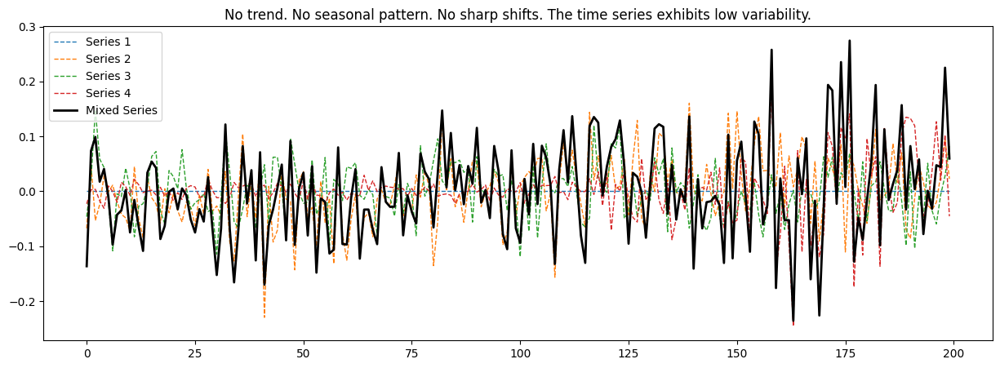

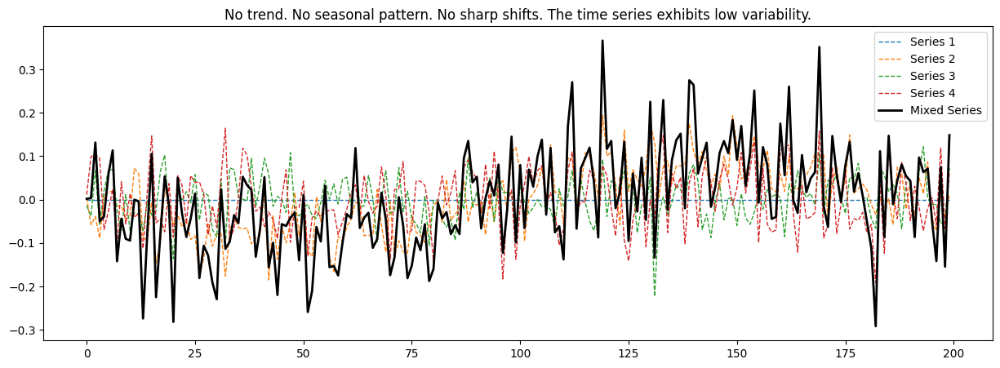

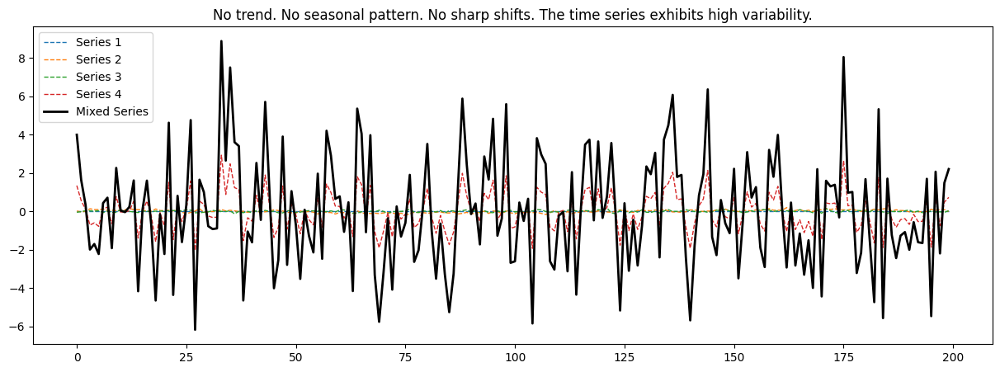

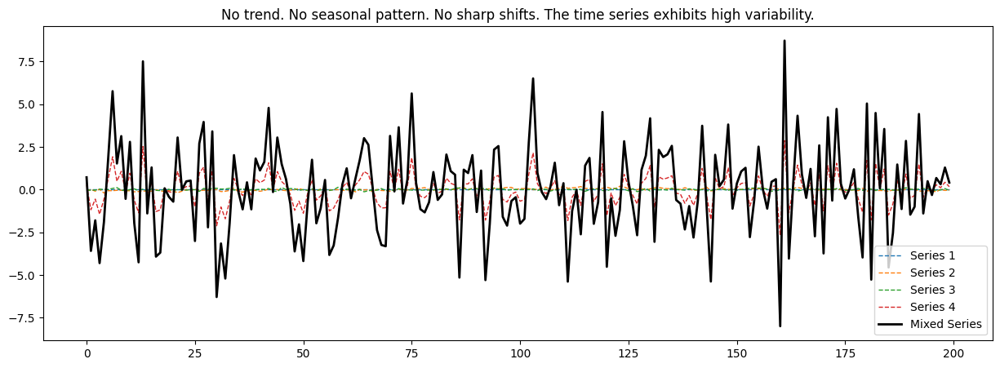

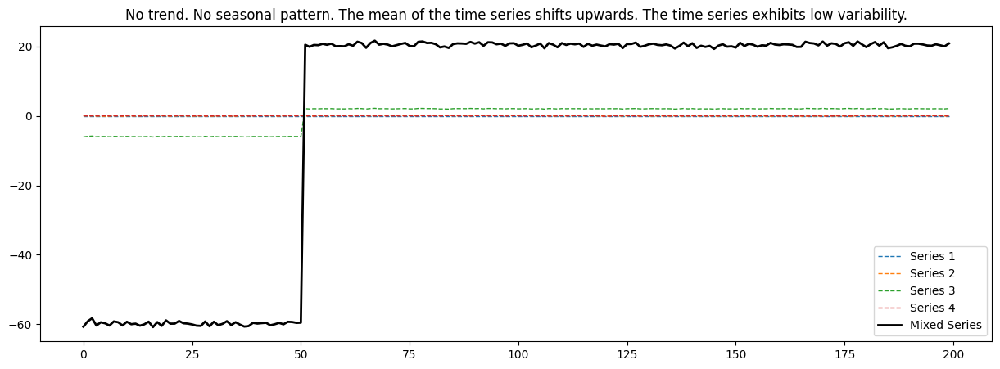

...

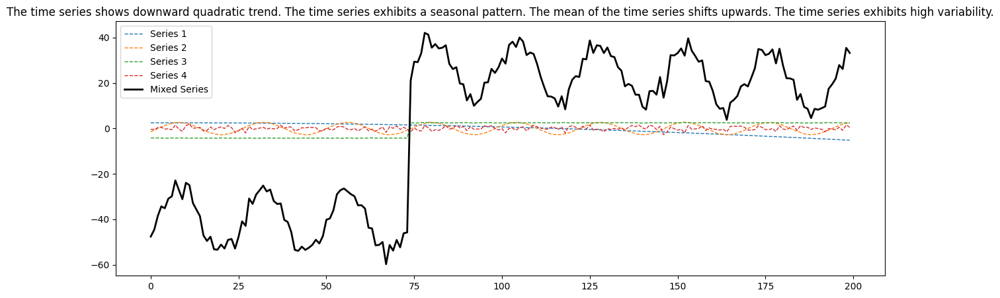

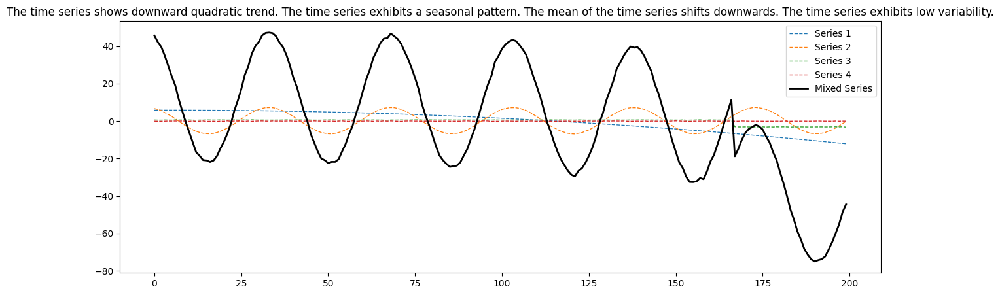

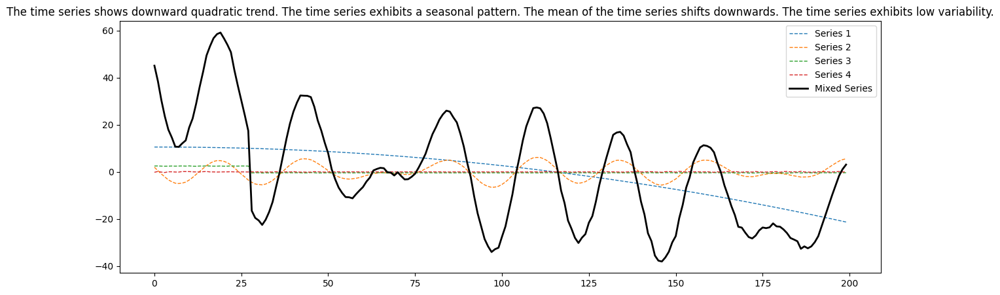

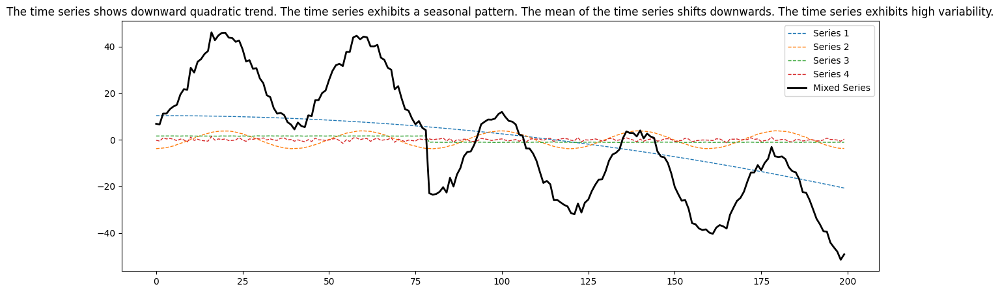

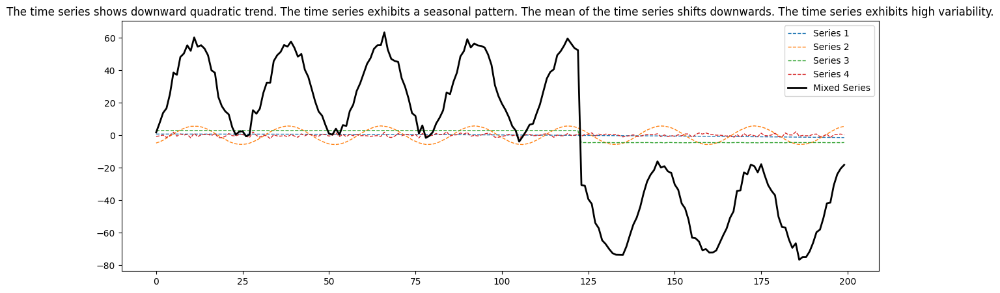

text
No trend. No seasonal pattern. No sharp shifts. The time series exhibits low variability.                                                                                                10000
No trend. No seasonal pattern. No sharp shifts. The time series exhibits high variability.                                                                                               10000
The time series shows downward linear trend. The time series exhibits a seasonal pattern. The mean of the time series shifts upwards. The time series exhibits low variability.          10000
The time series shows downward linear trend. The time series exhibits a seasonal pattern. The mean of the time series shifts upwards. The time series exhibits high variability.         10000
The time series shows downward linear trend. The time series exhibits a seasonal pattern. The mean of the time series shifts downwards. The time series exhibits low variability.        10000
The time series shows downward linear tr

/Users/joyqiu/Documents/Documents JoyQiu Work/Research/LLMTimeSeries/llm_nicu_vitalsigns/clip_env/lib/python3.11/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


In [3]:
# change data preparation for a given experiment
with open('prepare_experiment/synthetic.py', 'r') as file:
    exec(file.read())
# prepare model inputs
with open('run/inputs.py', 'r') as file:
    exec(file.read())

# Model (customizable)

In [4]:
# customize encoder and decoder here. 
ts_encoder = MultiCNNEncoder(ts_dim = ts_f_dim.shape[1],
                             output_dim=config_dict['embedded_dim'],
                             kernel_sizes=[80, 50, 20, 5],
                             hidden_num_channel=16,
                             dropout=0)
ts_decoder = TransformerDecoder(ts_dim = ts_f_dim.shape[1], output_dim = config_dict['embedded_dim']+2, 
                 nhead = 8,
                 num_layers = 6,
                 dim_feedforward = 512,
                 dropout = 0.1)
text_encoder = TextEncoderMultiCNN(text_dim = tx_f_dim.shape[1],
                                   output_dim=config_dict['embedded_dim'],
                                   kernel_sizes=[500, 250, 100],  # Different context windows
                                   hidden_num_channel=16,
                                   dropout=0.0)
# overwrite = False
with open('run/model.py', 'r') as file:
    exec(file.read())


Layer (type:depth-idx)                                                      Param #
VITAL                                                                       1
├─TSVAEEncoder: 1-1                                                         --
│    └─LocalNorm: 2-1                                                       --
│    └─MultiCNNEncoder: 2-2                                                 512
│    │    └─ModuleList: 3-1                                                 3,281,520
│    │    └─MultiheadAttention: 3-2                                         1,050,624
│    │    └─LayerNorm: 3-3                                                  1,024
│    └─Linear: 2-3                                                          262,656
│    └─Linear: 2-4                                                          262,656
├─TextEncoder: 1-2                                                          --
│    └─TextEncoderMultiCNN: 2-5                                             512
│    │    └─ModuleL

# Train

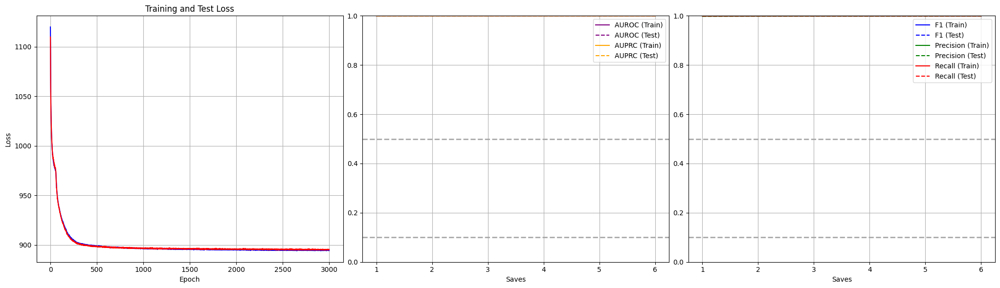

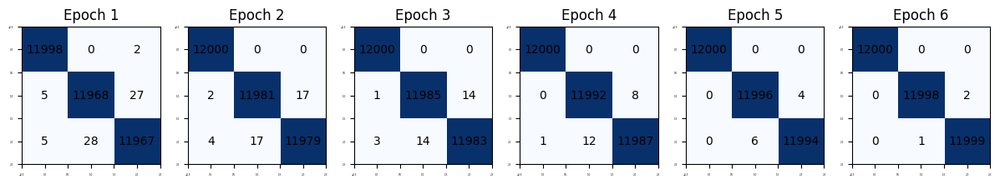

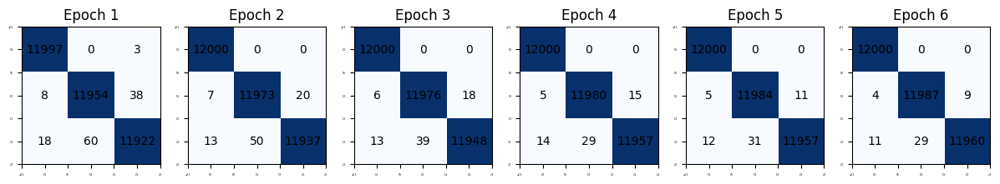

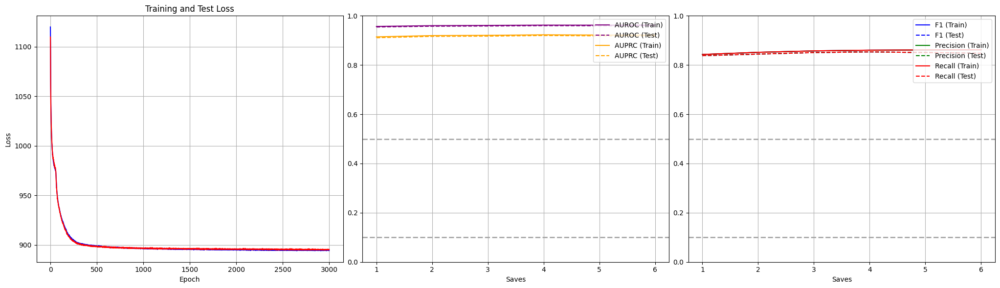

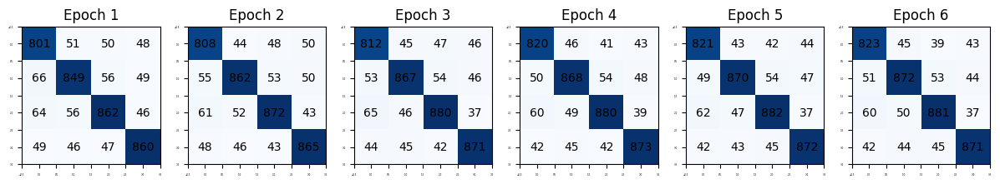

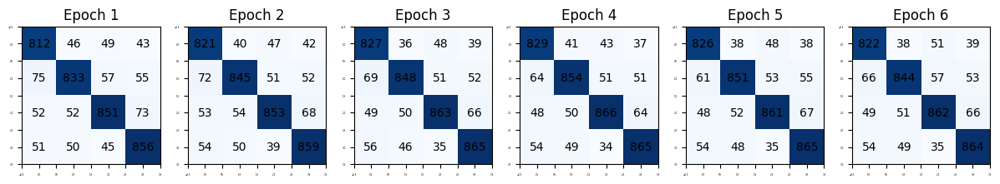

KeyboardInterrupt: 

In [5]:
# overwrite = False
with open('run/train.py', 'r') as file:
    exec(file.read())


# Generation

In [6]:
tid=0
# viz_generation_marginal(df_train, model, config_dict, tid=tid)
viz_generation_conditional(df_train, model, config_dict, tid=tid, sampling=True, b=100, ep=200)

0    The time series shows upward linear trend.
Name: segment1, dtype: object


KeyboardInterrupt: 

# Math statistics

In [7]:
# calculate the properties of the generated time series
df = df_test.sample(1000)
df_augmented_all = eval_math_properties(df, model, config_dict, type = "conditional", w = 0.8)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment 

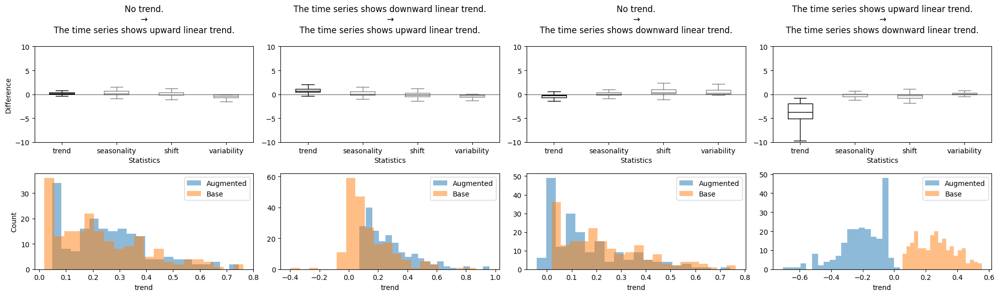

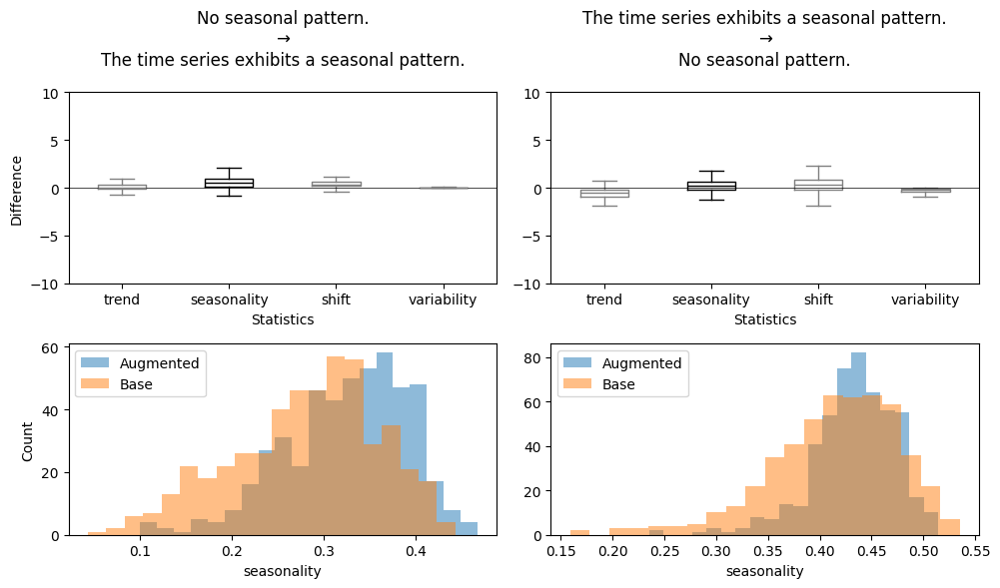

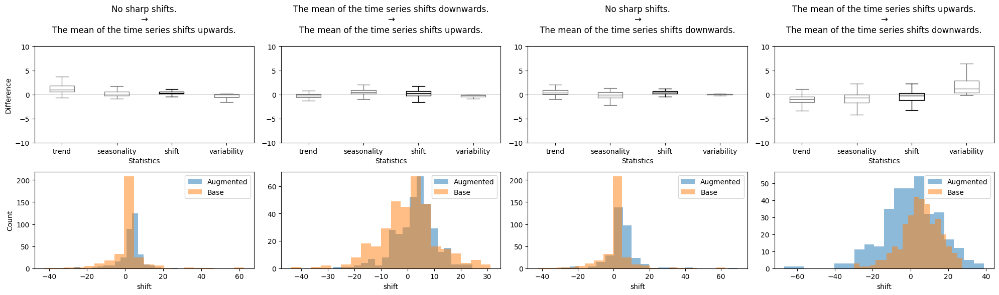

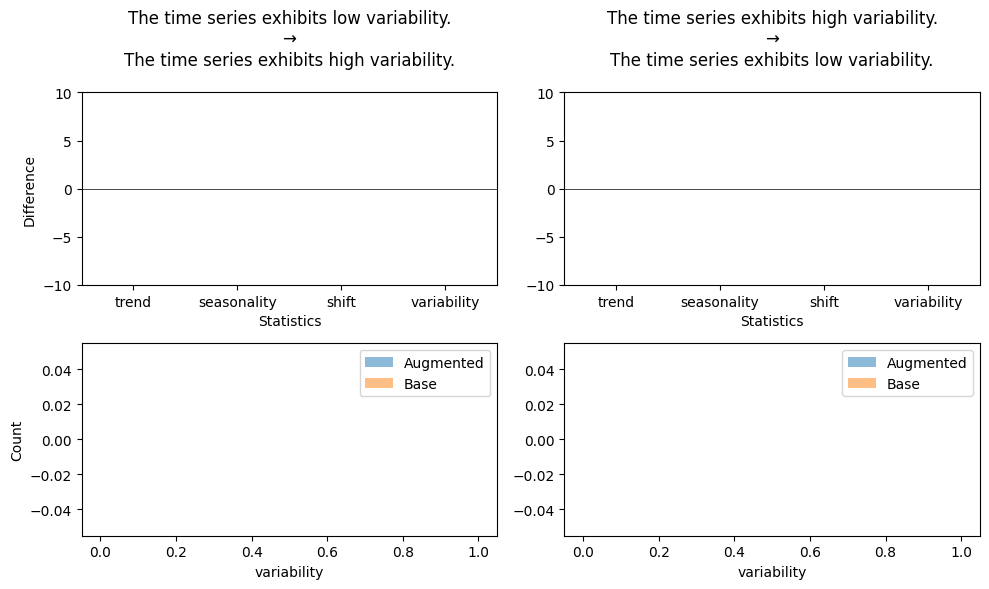

/Users/joyqiu/Documents/Documents JoyQiu Work/Research/LLMTimeSeries/llm_nicu_vitalsigns/script/VITAL/eval.py:168: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  res_df = pd.concat(df_ls)


In [9]:
# Define the base augmentation pairs
base_aug_dict = {'trend': [('No trend.', 'The time series shows upward linear trend.'), 
                            ('The time series shows downward linear trend.', 'The time series shows upward linear trend.'),
                            ('No trend.', 'The time series shows downward linear trend.'), 
                            ('The time series shows upward linear trend.', 'The time series shows downward linear trend.')],
                #     'curvature': [('No trend.', 'The time series shows upward quadratic trend.'),
                #                   ('The time series shows upward linear trend.', 'The time series shows upward quadratic trend.'),
                #                   ('No trend.', 'The time series shows downward quadratic trend.'),
                #                   ('The time series shows downward linear trend.', 'The time series shows downward quadratic trend.')],
                    'seasonality': [('No seasonal pattern.', 'The time series exhibits a seasonal pattern.'),
                                ('The time series exhibits a seasonal pattern.', 'No seasonal pattern.')],
                    'shift': [('No sharp shifts.', 'The mean of the time series shifts upwards.'),
                            ('The mean of the time series shifts downwards.', 'The mean of the time series shifts upwards.'),
                            ('No sharp shifts.', 'The mean of the time series shifts downwards.'),
                            ('The mean of the time series shifts upwards.', 'The mean of the time series shifts downwards.')],
                    'variability': [("The time series exhibits low variability.", "The time series exhibits high variability."),
                                ('The time series exhibits high variability.', "The time series exhibits low variability.")]
                    }

df_stats = eng_math_diff_multiple(df_augmented_all, base_aug_dict, metrics=['trend', 'seasonality', 'shift', 'variability'])